By: **Rishabh Raj**, rishraj.2000@gmail.com

#I have used YOLOv5!

Checking connection with gpu

In [1]:
from IPython.display import HTML
from subprocess import getoutput
s = getoutput('nvidia-smi')
print(s)
if 'K80' in s:
    gpu = 'K80'
elif 'T4' in s:
    gpu = 'T4'
elif 'P100' in s:
    gpu = 'P100'
else:
    gpu='DONT PROCEED'
display(HTML(f"<h1>{gpu}</h1>"))

Sat Jul  3 06:42:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

I'm not using colab's cloud storage as the saved weights get lost if there is any connectivity error

Mounting my G drive 

In [2]:
from google.colab import drive
drive.mount('/gdrive')
#drive.mount("/gdrive", force_remount=True)

Mounted at /gdrive


In [3]:
%cd /gdrive/MyDrive/yolov5
!chmod +x ./yolov5
!./yolov5

/gdrive/MyDrive/yolov5
/bin/bash: ./yolov5: Is a directory


Cloning the YOLOv5 repo at my G Drive location

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 7710, done.
remote: Counting objects: 100% (430/430), done.
remote: Compressing objects: 100% (189/189), done.
remote: Total 7710 (delta 273), reused 335 (delta 238), pack-reused 7280
Receiving objects: 100% (7710/7710), 9.08 MiB | 11.16 MiB/s, done.
Resolving deltas: 100% (5290/5290), done.
/gdrive/My Drive/yolov5/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


Importing Pytorch and other dependencies 

In [6]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 645kB 31.4MB/s 
Setup complete. Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


I have first uploaded all the images to roboflow.com as it checks if all the annotations are valid. In this dataset all annotations were valid

Downloading the images which I had uploaded to roboflow

In [ ]:
# Export code snippet and paste here
%cd /gdrive/My Drive/yolov5
!curl -L "https://app.roboflow.com/ds/vsaJbNcesK?key=9dEub0OF6w" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: train/labels/hard_hat_workers1140_png.rf.b06420cf6de085f8710fb0000d293dc1.txt  
 extracting: train/labels/hard_hat_workers1141_png.rf.4462415153411f9a37b8c37d7ff0f816.txt  
 extracting: train/labels/hard_hat_workers1142_png.rf.ee48b3a695799ecdb1dd285fdb96394d.txt  
 extracting: train/labels/hard_hat_workers1143_png.rf.8b75addd30749a32370fd9f6a754b46a.txt  
 extracting: train/labels/hard_hat_workers1144_png.rf.7513aa0b5038096b5fee08894014fac3.txt  
 extracting: train/labels/hard_hat_workers1145_png.rf.88f13b49b02ef50f9f999a56eb9b3bf1.txt  
 extracting: train/labels/hard_hat_workers1147_png.rf.f95689f702101253a8f1defa61ed2395.txt  
 extracting: train/labels/hard_hat_workers1148_png.rf.6d5f084ddf61478bc5a3d38dca3df462.txt  
 extracting: train/labels/hard_hat_workers1149_png.rf.7814f2247f2da84d801437241970ff9b.txt  
 extracting: train/labels/hard_hat_workers114_png.rf.a57bd44f55026f0be662ad89586c1139.txt  
 extracting: train/l

In [9]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['head', 'helmet', 'person']

Define number of classes based on YAML

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

This is the model configuration:

In [10]:
%cat /gdrive/MyDrive/yolov5/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

Customize iPython writefile so we can write variables

In [12]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /gdrive/My Drive/yolov5/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

#Training that dataset over 300 epochs on training set which is 90% of total data

I trained with higher number of epochs also, but there isn't any growth after 250 epochs 

In [ ]:
%%time
%cd /gdrive/My Drive/yolov5/yolov5
!python train.py --img 416 --batch 16 --epochs 300 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/gdrive/My Drive/yolov5/yolov5
github: ⚠️ WARNING: code is out of date by 326 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', entity=None, epochs=300, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results2', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "te

In [4]:
%cd /gdrive/My Drive/yolov5/yolov5

/gdrive/My Drive/yolov5/yolov5


In [16]:
!python train.py --resume

github: ⚠️ WARNING: code is out of date by 329 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
Resuming training from ./runs/train/yolov5s_results2/weights/last.pt
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='', data='../data.yaml', device='', entity=None, epochs=300, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=True, save_dir='runs/train/yolov5s_results2', single_cls=False, sync_bn=False, total_batch_size=16, weights='./runs/train/yolov5s_results2/weights/last.pt', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip i

In [ ]:
#%cd /gdrive/My Drive/yolov5/yolov5
#!python train.py --resume ../runs/train/yolov5s_results/weights/last.pt

#Training analysis 

We received a MAP of around 63%

In [ ]:
# Start tensorboard
# logs save in the folder "runs"
%reload_ext tensorboard
%tensorboard --logdir runs

Reusing TensorBoard on port 6006 (pid 350), started 1:25:33 ago. (Use '!kill 350' to kill it.)

<IPython.core.display.Javascript object>

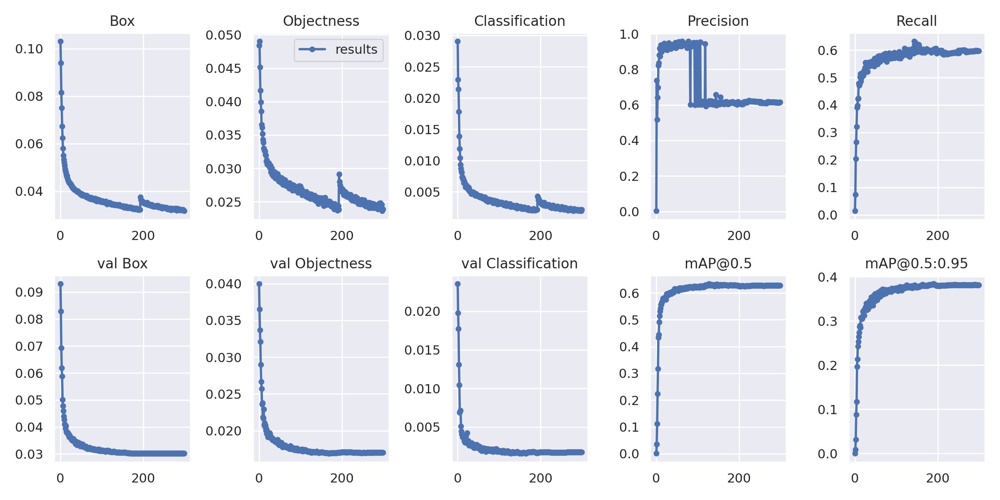

In [24]:
# we can also output some older school graphs 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/gdrive/My Drive/yolov5/yolov5/runs/train/yolov5s_results2/results.png', width=1000) 

GROUND TRUTH TRAINING DATA:


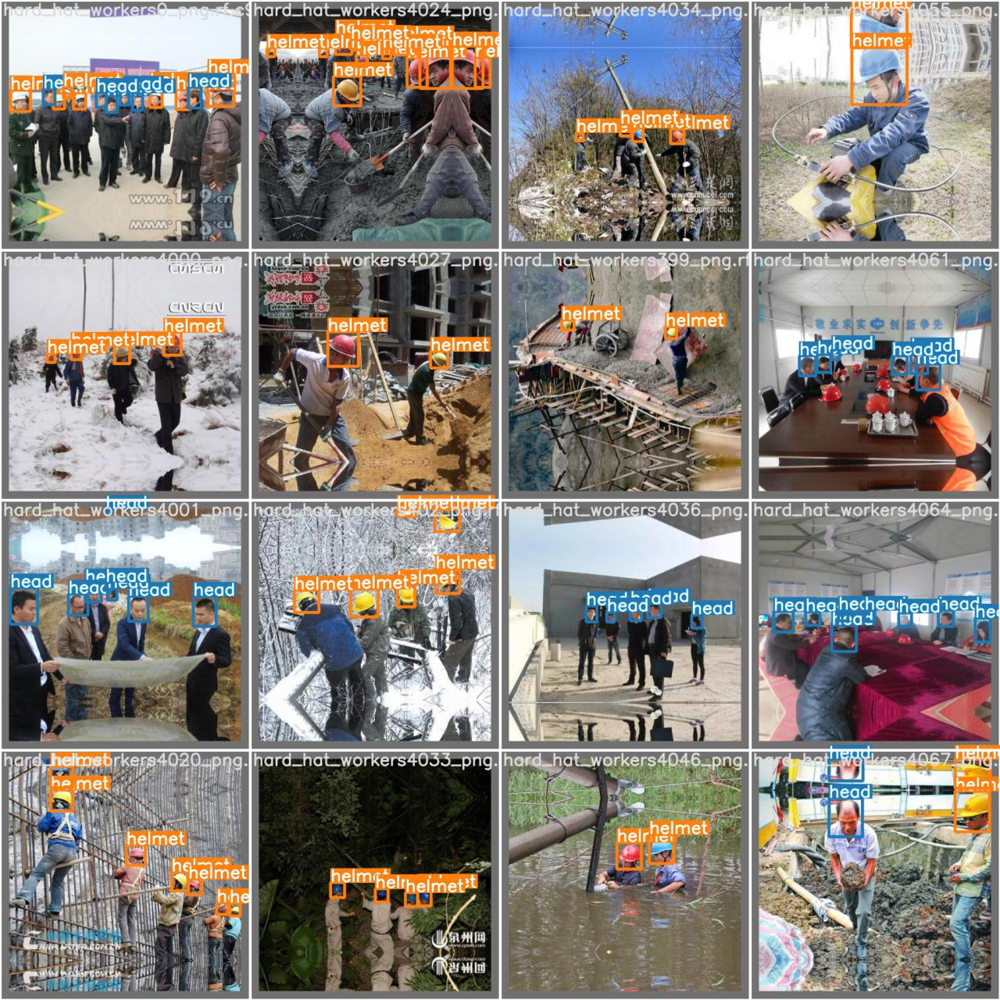

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/gdrive/My Drive/yolov5/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

Confusion Matrix:


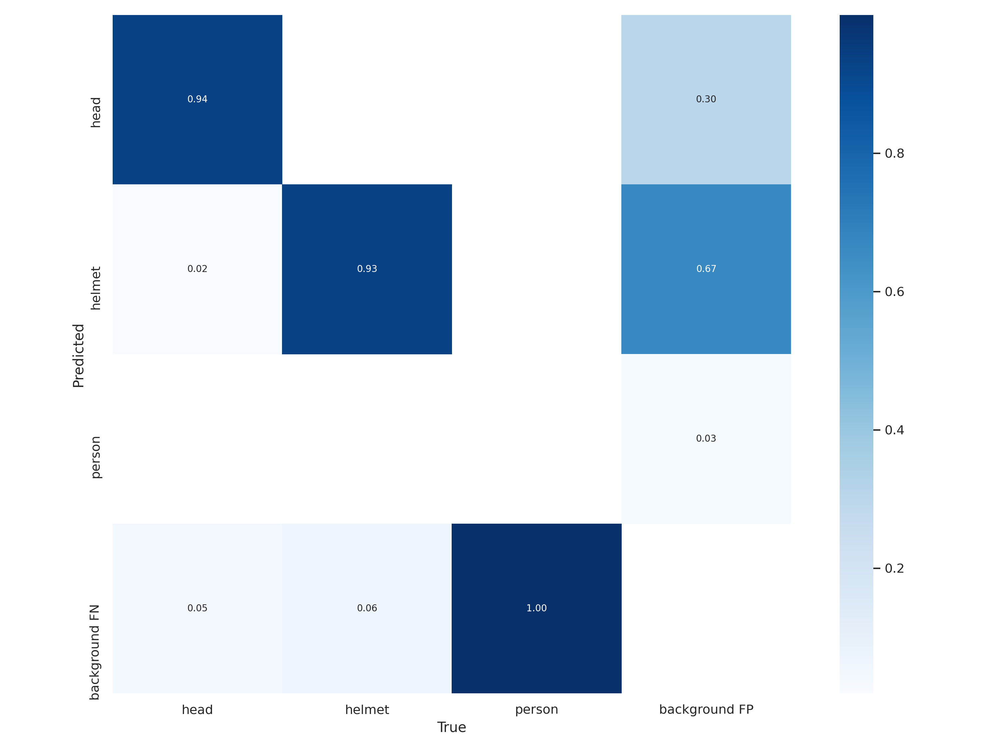

In [25]:
print("Confusion Matrix:")
Image(filename='/gdrive/My Drive/yolov5/yolov5/runs/train/yolov5s_results2/confusion_matrix.png', width=900)

labels


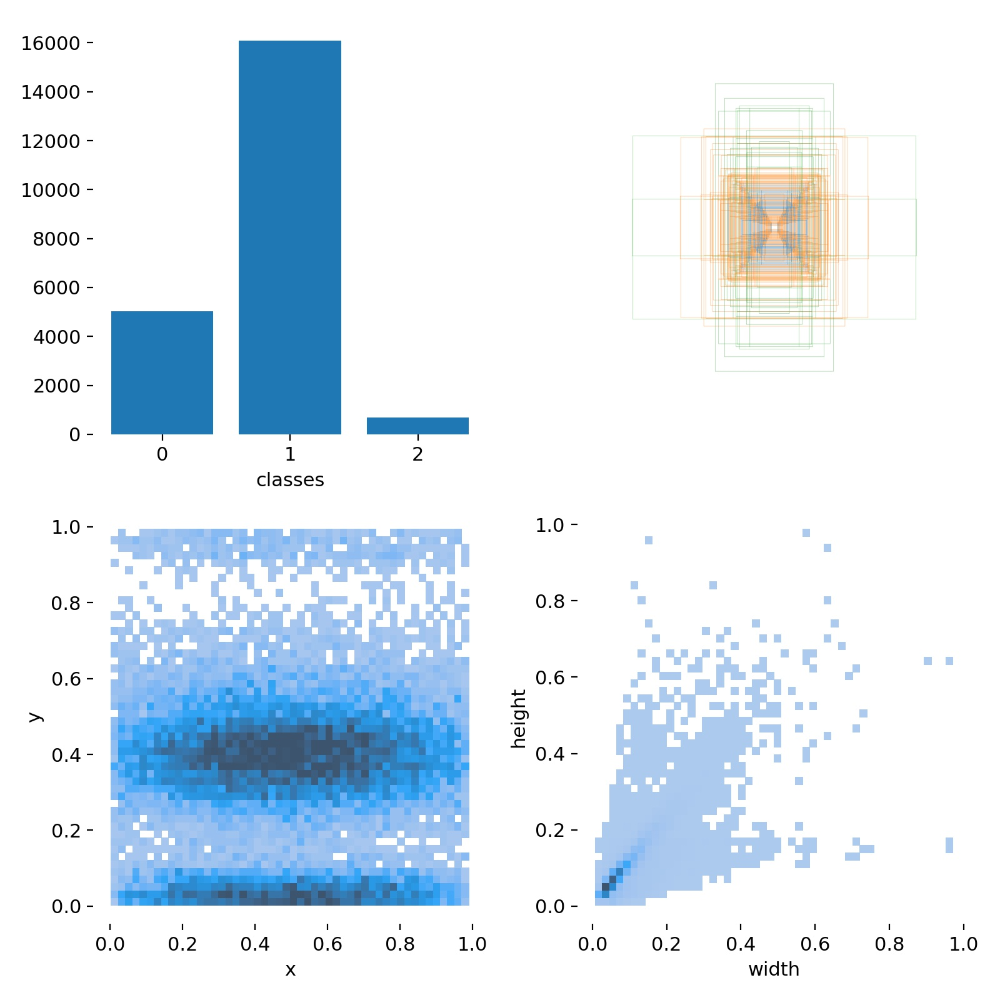

In [26]:
print("labels")
Image(filename='/gdrive/My Drive/yolov5/yolov5/runs/train/yolov5s_results2/labels.jpg', width=900)

F1 curve:


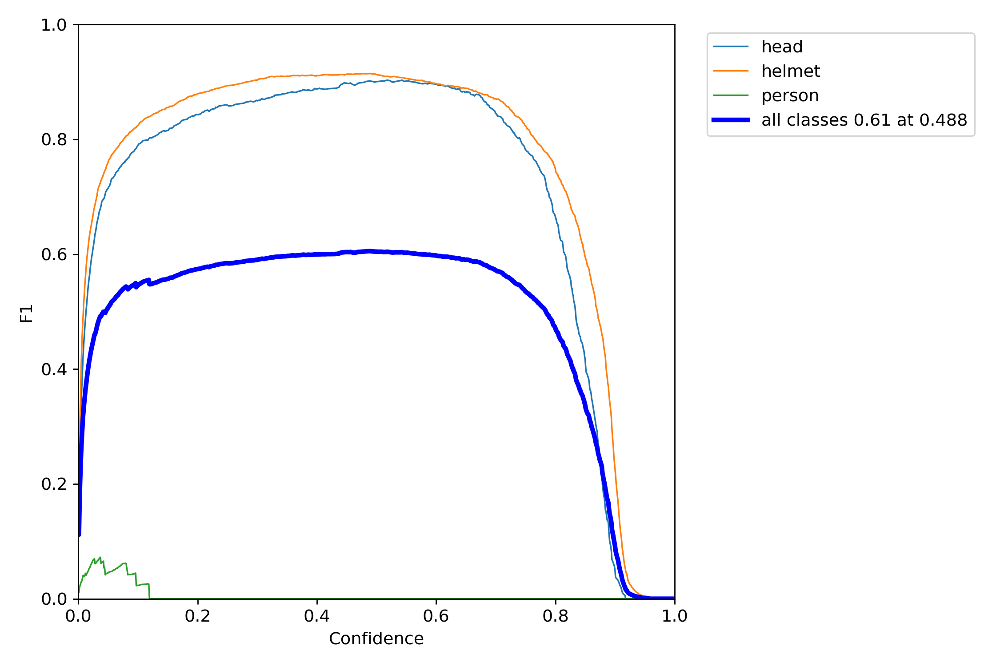

In [29]:
print("F1 curve:")
Image(filename='/gdrive/My Drive/yolov5/yolov5/runs/train/yolov5s_results2/F1_curve.png', width=600)

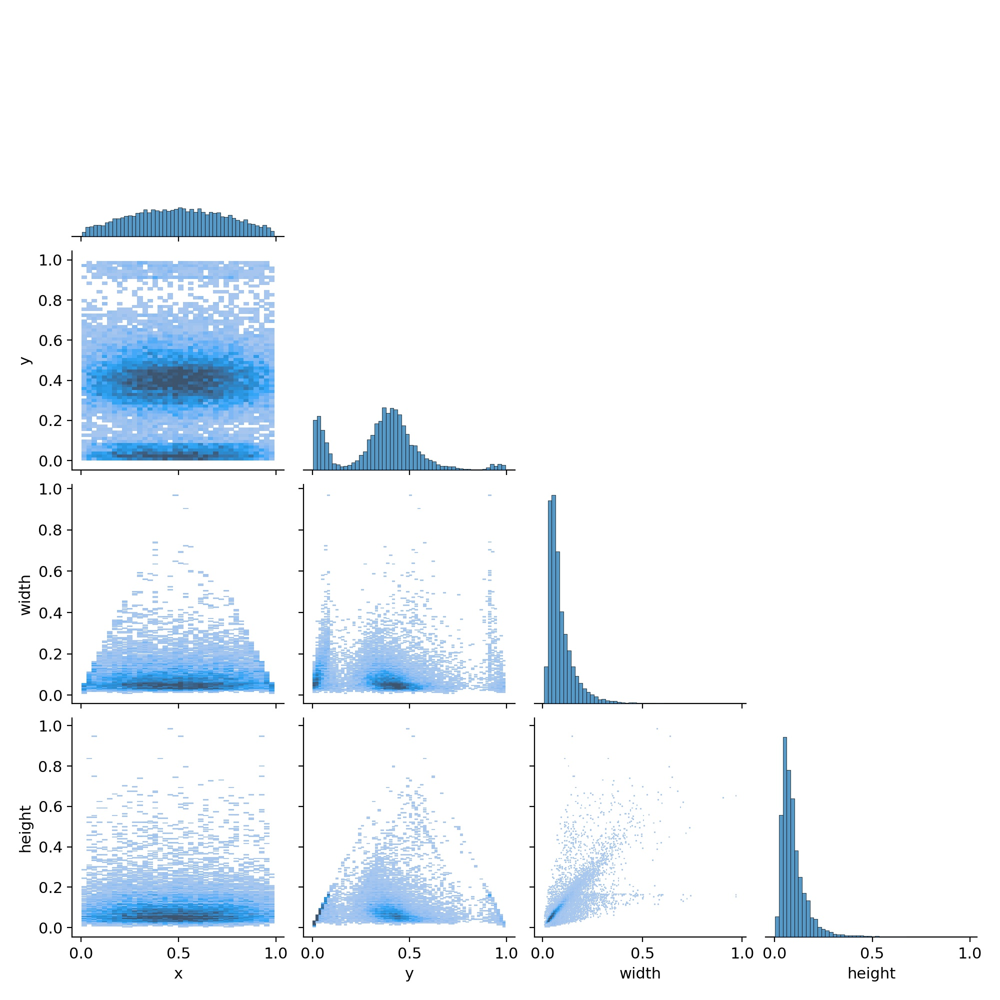

In [31]:
Image(filename='/gdrive/My Drive/yolov5/yolov5/runs/train/yolov5s_results2/labels_correlogram.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


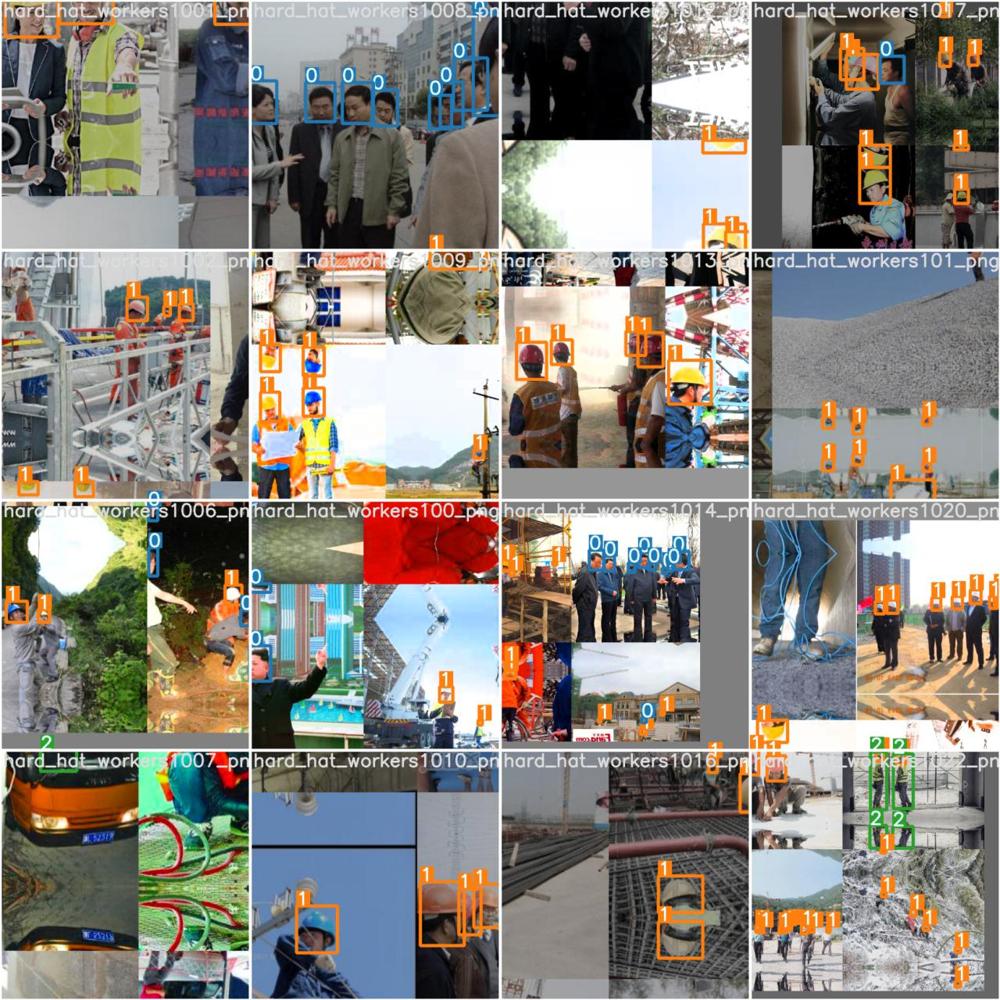

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/gdrive/My Drive/yolov5/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

In [32]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  train/


In [34]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [36]:
# use the best weights!
%cd /gdrive/My Drive/yolov5/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/gdrive/My Drive/yolov5/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
image 1/48 /gdrive/My Drive/yolov5/yolov5/../test/images/hard_hat_workers105_png.rf.bca74

In [38]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

#Giving the test video which is saved in my G drive

The video gets saved in the location which comes written after training

In [35]:
%cd /gdrive/My Drive/yolov5/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source /gdrive/MyDrive/wobot_video.mp4

Streaming output truncated to the last 5000 lines.
video 1/1 (11666/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 head, Done. (0.009s)
video 1/1 (11667/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 head, 1 helmet, Done. (0.008s)
video 1/1 (11668/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 head, 1 helmet, Done. (0.009s)
video 1/1 (11669/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 helmet, Done. (0.009s)
video 1/1 (11670/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 helmet, Done. (0.008s)
video 1/1 (11671/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 helmet, Done. (0.008s)
video 1/1 (11672/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 helmet, Done. (0.008s)
video 1/1 (11673/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 helmet, Done. (0.009s)
video 1/1 (11674/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 helmet, Done. (0.008s)
video 1/1 (11675/16663) /gdrive/MyDrive/wobot_video.mp4: 256x416 1 helmet, Done. (0.008s)
video 1/1 (11676/16663) /gdrive/MyD

#Giving the test images for Stage 2

YOLO saves the label output in .TXT format

In [43]:
%cd /gdrive/My Drive/yolov5/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source /gdrive/MyDrive/yolov5/wobot_test --save-txt --save-conf

/gdrive/My Drive/yolov5/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=True, save_txt=True, source='/gdrive/MyDrive/yolov5/wobot_test', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
image 1/250 /gdrive/MyDrive/yolov5/wobot_test/hard_hat_workers1015.png: 

Converted the txt format label to xml format